# Importing Petinent Libraries and Dataset

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [2]:
#importing the dataset
bean = pd.read_excel("Dry_Bean_Dataset.xlsx")

---

# Exploratory Data Analysis

## Inspecting the data

In [3]:
#Previewing the dataset
display(bean.head())
display(bean.describe().T)
print(f"⦿ Rows: {bean.shape[0]}")
print(f"⦿ Columns: {bean.shape[1]}")

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,254616.000000
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1985.370000
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860153
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,460.198497
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,53768.200206,29774.915817,20684.000000,36714.500000,45178.000000,62294.000000,263261.000000
EquivDiameter,13611.0,253.064220,59.177120,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,0.994677


⦿ Rows: 13611
⦿ Columns: 17


In [4]:
#Checking for data types
bean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

⦿ There are no missing values.  
⦿ There are no null entries.  
⦿ Each column contains appropriate data type.  

## Checking Duplicates

In [5]:
#Checking for duplicates
duplicate_rows = bean[bean.duplicated(keep=False)]

#Confirming actual duplicates
if bean.duplicated().sum() > 0:
    display(duplicate_rows)
    print(f"⦿ {bean.duplicated().sum()} duplicate rows found")
    print(f"⦿ Duplicate Class: {duplicate_rows['Class'].unique()}")

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
5504,33518,702.956,277.571399,154.305581,1.798842,0.831240,34023,206.582775,0.808383,0.985157,0.852377,0.744251,0.008281,0.001567,0.553909,0.996396,HOROZ
5505,33518,702.956,277.571399,154.305581,1.798842,0.831240,34023,206.582775,0.808383,0.985157,0.852377,0.744251,0.008281,0.001567,0.553909,0.996396,HOROZ
5508,33954,716.750,277.368480,156.356326,1.773951,0.825970,34420,207.922042,0.799482,0.986461,0.830549,0.749624,0.008169,0.001591,0.561936,0.996847,HOROZ
5509,33954,716.750,277.368480,156.356326,1.773951,0.825970,34420,207.922042,0.799482,0.986461,0.830549,0.749624,0.008169,0.001591,0.561936,0.996847,HOROZ
5547,38427,756.323,306.533886,160.591784,1.908777,0.851782,38773,221.193978,0.796976,0.991076,0.844174,0.721597,0.007977,0.001334,0.520702,0.993905,HOROZ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7285,63948,996.497,412.297178,198.877557,2.073121,0.875971,64641,285.343867,0.777909,0.989279,0.809254,0.692083,0.006447,0.000912,0.478979,0.992981,HOROZ
7339,65766,1035.842,406.416622,207.242369,1.961069,0.860218,66698,289.371512,0.792295,0.986027,0.770237,0.712007,0.006180,0.000980,0.506954,0.994172,HOROZ
7340,65766,1035.842,406.416622,207.242369,1.961069,0.860218,66698,289.371512,0.792295,0.986027,0.770237,0.712007,0.006180,0.000980,0.506954,0.994172,HOROZ
7341,65781,1039.257,409.713859,204.992832,1.998674,0.865834,66762,289.404510,0.642549,0.985306,0.765358,0.706358,0.006228,0.000956,0.498941,0.997221,HOROZ


⦿ 68 duplicate rows found
⦿ Duplicate Class: ['HOROZ']


In [6]:
#Dropping duplicates
bean.drop_duplicates(inplace=True)

#Confirming duplicates have been dropped
display(bean.duplicated().sum())

#Checking new shape
print(f"⦿ Rows: {bean.shape[0]}")
print(f"⦿ Columns: {bean.shape[1]}")

0

⦿ Rows: 13543
⦿ Columns: 17


## Checking Class Count

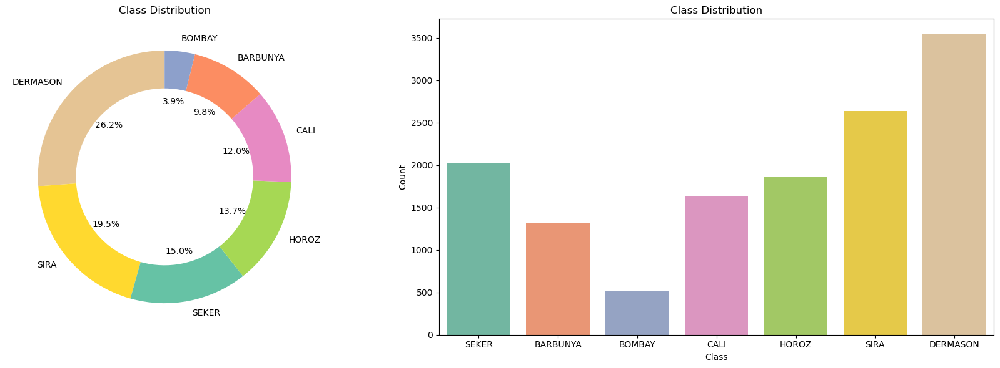

In [7]:
#Setting up figure and axes
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

#Setting Class colours
custom_palette = sns.color_palette("Set2", len(bean["Class"].unique()))
class_colors = dict(zip(bean["Class"].unique(), custom_palette))

#Pie chart
class_counts = bean["Class"].value_counts()
labels = class_counts.index
colors = [class_colors[label] for label in labels]
wedges, texts, autotexts = axes[0].pie(class_counts, labels=labels, autopct="%1.1f%%", startangle=90, wedgeprops=dict(width=0.3), colors=colors)
axes[0].set_title("Class Distribution")
plt.setp(autotexts, size=10)

#Count plot
sns.countplot(x="Class", data=bean, palette=custom_palette, ax=axes[1])
axes[1].set_title("Class Distribution")
axes[1].set_xlabel("Class")
axes[1].set_ylabel("Count")


plt.tight_layout()
plt.show()


⦿ BOMBAY has the least number of samples.  
⦿ DERMASON has the highest number of samples.

## Checking Distribution

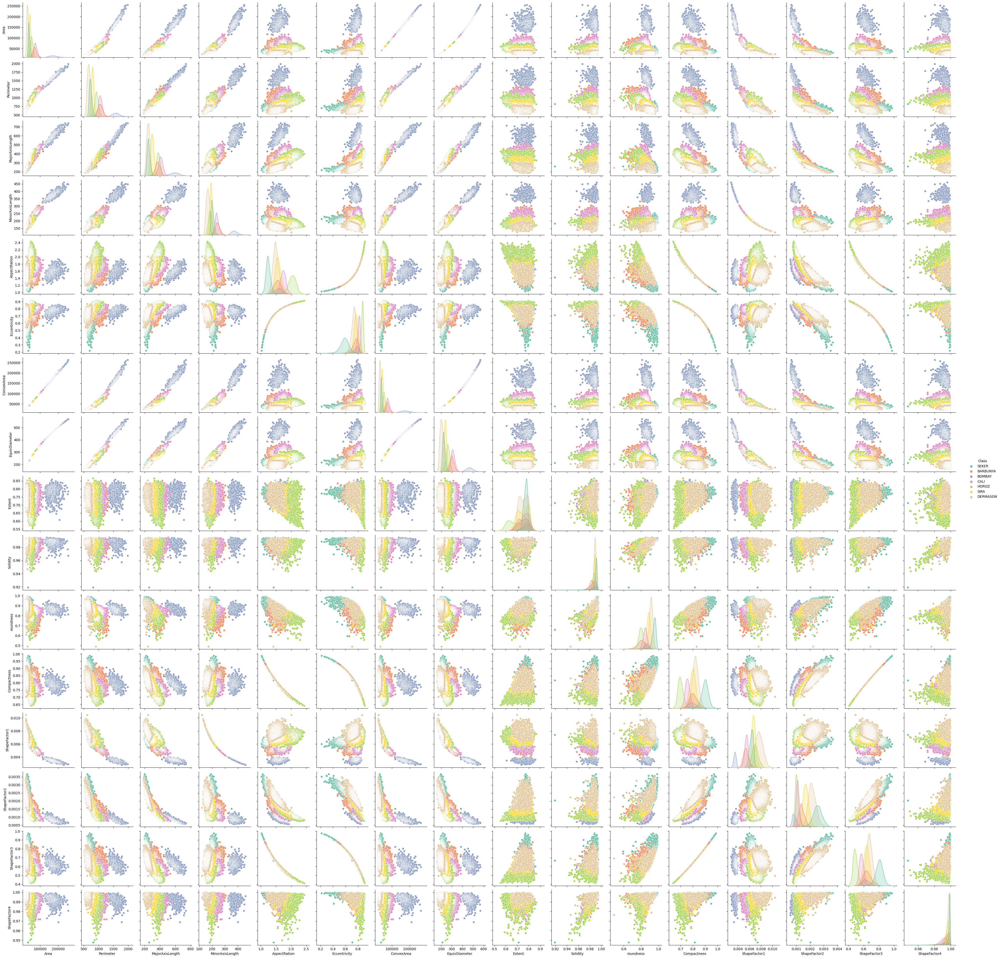

In [8]:
#Checking distribution
sns.pairplot(bean, hue="Class", palette=custom_palette)
plt.show()

⦿ Some features show linear relationships between them.  
⦿ BOMBAY shows a distintion between it's features and other classes' features

In [9]:
#Checking skew
bean.skew(axis=0)

Area               2.947136
Perimeter          1.628018
MajorAxisLength    1.365813
MinorAxisLength    2.232013
AspectRation       0.589045
Eccentricity      -1.064932
ConvexArea         2.936102
EquivDiameter      1.947303
Extent            -0.895655
Solidity          -2.546877
roundness         -0.648725
Compactness        0.036309
ShapeFactor1      -0.530427
ShapeFactor2       0.294332
ShapeFactor3       0.242767
ShapeFactor4      -2.760125
dtype: float64

⦿ Area, Perimeter, MajorAxislength, MinorAxisLength, ConvexArea and EquivDiameter have positive skewness  
⦿ Eccentricity, Solidity and ShapeFactor4 have negative skewness  
⦿ AspectRation, Extent, roundness, Compactness, ShapeFactor1, ShapeFactor2 and ShapeFactor3 have values closer to zero and would suggest they have more symmetric distributions

## Checking Correlation

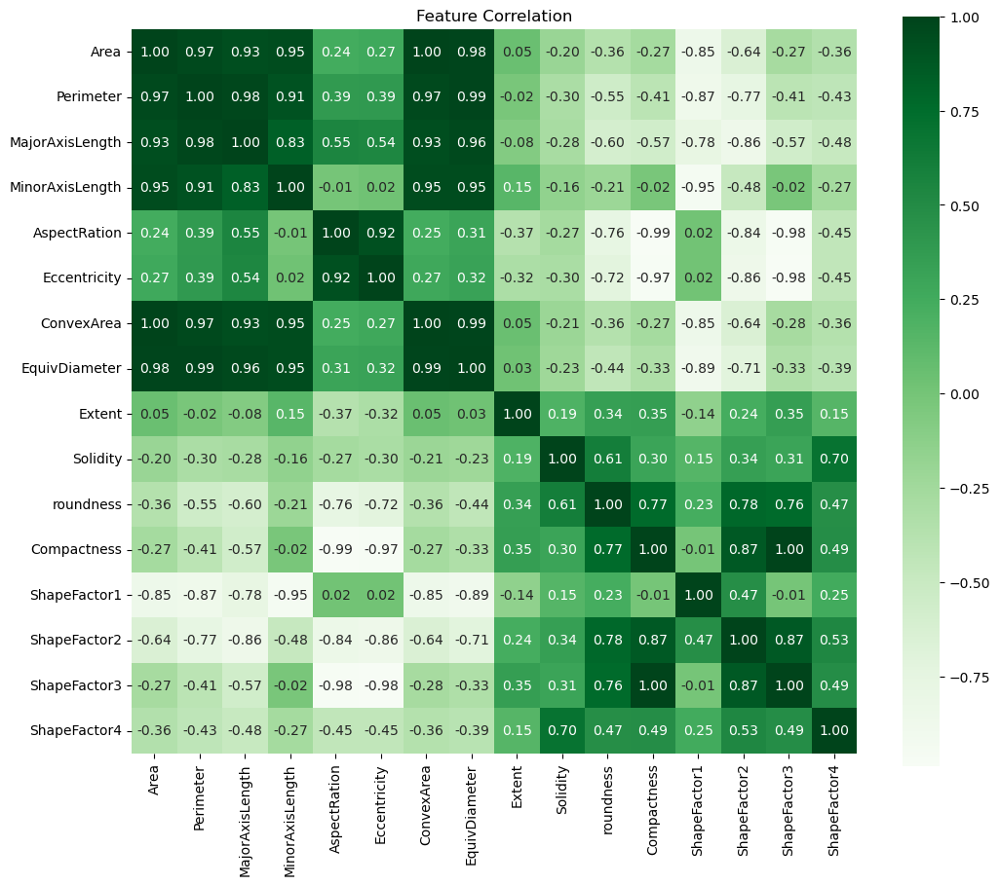

In [10]:
#Checking correlation
plt.figure(figsize=(12, 10))
sns.heatmap(bean.corr(), annot=True, cmap='Greens', fmt=".2f", square=True)
plt.title('Feature Correlation')
plt.show()



⦿ Area, Perimeter, MajorAxisLength, MinorAxisLength, ConvexArea, ShapeFactor1 have between 0.84 to 1.00 positive or negative correlation with at least 5 other features.  
⦿ The hightest correlation between two features is 1, while the least is 0.01

## Data Spliting

In [11]:
bean_feat = bean.drop("Class", axis=1)
bean_label = bean["Class"]

In [12]:
#Spliting to train and test datasets
bean_feat_train_val, bean_feat_test, bean_label_train_val, bean_label_test = train_test_split(bean_feat, bean_label, test_size=0.2, random_state=23)


#Spliting train to validation and training
bean_feat_train, bean_feat_val, bean_label_train, bean_label_val = train_test_split(bean_feat_train_val, bean_label_train_val, test_size=0.1, random_state=23)

In [13]:
#Checking all dataset contains all 7 Classes
print(f"Train Dataset:\n {bean_label_train.value_counts(normalize=True)}\n")
print(f"Validation Dataset:\n {bean_label_val.value_counts(normalize=True)}\n")
print(f"Test Dataset:\n {bean_label_test.value_counts(normalize=True)}")

Train Dataset:
 DERMASON    0.262564
SIRA        0.192103
SEKER       0.145949
HOROZ       0.139385
CALI        0.121846
BARBUNYA    0.098974
BOMBAY      0.039179
Name: Class, dtype: float64

Validation Dataset:
 DERMASON    0.251845
SIRA        0.211255
SEKER       0.145756
HOROZ       0.133764
CALI        0.108856
BARBUNYA    0.104244
BOMBAY      0.044280
Name: Class, dtype: float64

Test Dataset:
 DERMASON    0.263197
SIRA        0.197121
SEKER       0.164636
HOROZ       0.131414
CALI        0.119601
BARBUNYA    0.090070
BOMBAY      0.033961
Name: Class, dtype: float64


⦿ Every class is present in train, validation and test datasets

---

# Modeling

In [14]:
#Defining a function to display model's performace
def model_score(actual, predicted):
    metrics = {}

    #Calculating accuracy
    metrics["accuracy"] = round(accuracy_score(actual, predicted) * 100, 2)

    #Calculating precision, recall, and F1 score for each class
    metrics_report = classification_report(actual, predicted, output_dict=True)

    # Calculate average precision, recall, and F1 score across all classes
    metrics["precision"] = round(metrics_report["macro avg"]["precision"] * 100, 2)
    metrics["recall"] = round(metrics_report["macro avg"]["recall"] * 100, 2)
    metrics["f1"] = round(metrics_report["macro avg"]["f1-score"] * 100, 2)

    return metrics


In [15]:
#Defining a function to plot confusion matrix
def plot_confusion_matrix(actual, predicted, classifier=""):
    #Getting labels from actual labels
    labels = sorted(set(actual))
    plt.rcParams["figure.figsize"] = (18, 10)
    
    display = sns.heatmap(confusion_matrix(actual, predicted),cmap="Greens", annot=True, fmt="d")
    display.set_xticklabels(labels, rotation=90, size=13)
    display.set_yticklabels(labels, rotation=0, size=13)
    
    plt.title(classifier, fontsize=18)
    plt.xlabel("Predicted Values", size=15)
    plt.ylabel("Actual Values", size=15)
    plt.show()

#### ⦿ Oversampling the dataset

In [19]:
#Initializing a SMOTE instance 
smote = SMOTE()

#Oversampling the validation dataset
bean_feat_val_OS, bean_label_val_OS = smote.fit_resample(bean_feat_val, bean_label_val)

#Oversampling the training dataset
bean_feat_train_OS, bean_label_train_OS = smote.fit_resample(bean_feat_train, bean_label_train)

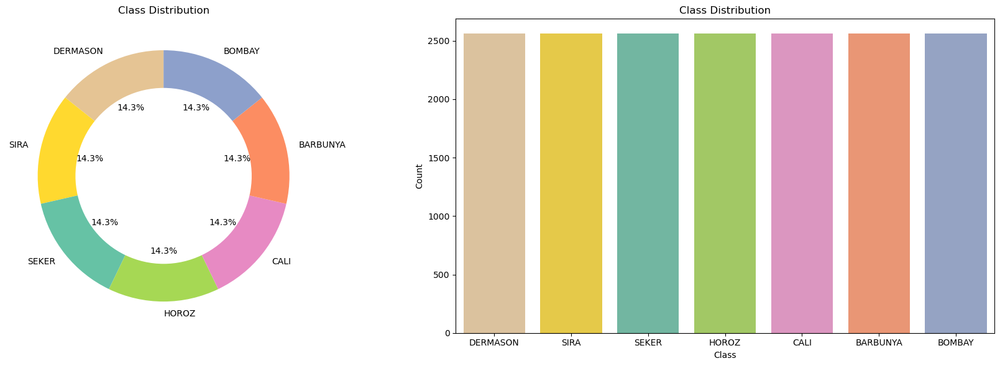

In [20]:
#Investigating oversampled train dataset
oversampled_labels = pd.DataFrame({"Class": bean_label_train_OS})

# Convert 'Class' column to categorical data type with desired categories
oversampled_labels['Class'] = pd.Categorical(oversampled_labels['Class'], categories=labels)

# Setting up figure and axes
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Pie chart
class_counts = oversampled_labels['Class'].value_counts()
labels = class_counts.index
class_counts = class_counts.values
colors = [class_colors[label] for label in labels]
wedges, texts, autotexts = axes[0].pie(class_counts, labels=labels, autopct="%1.1f%%", startangle=90, wedgeprops=dict(width=0.3), colors=colors)
axes[0].set_title("Class Distribution")
plt.setp(autotexts, size=10)

# Count Plot
sns.countplot(data=oversampled_labels, x='Class', palette=colors, ax=axes[1])
axes[1].set_title("Class Distribution")
axes[1].set_xlabel("Class")
axes[1].set_ylabel("Count")

plt.tight_layout()
plt.show()

#### ⦿ Scaling the dataset

In [24]:
#Initializing a StandardScaler Instance
scaler = StandardScaler()

#Fitting the scaler on the train data
scaler.fit(bean_feat_train)

#Scaling the train, validation and test features
bean_feat_train_scaled = scaler.transform(bean_feat_train)
bean_feat_val_scaled = scaler.transform(bean_feat_val)
bean_feat_test_scaled = scaler.transform(bean_feat_test)

#### ⦿ Scaling the oversampled dataset

In [28]:
#Fitting the scaler on the train data
scaler.fit(bean_feat_train_OS)

#Scaling the train and validation dataset features
bean_feat_train_scaledOS = scaler.transform(bean_feat_train_OS)
bean_feat_val_scaledOS = scaler.transform(bean_feat_val_OS)

## Primary Model - Logistic Regression

### ✲ Using original dataset(imbalanced and unscaled)

⦿ Starting with imbalanced, unscaled data and default model hyperparameters

In [16]:
#Creating a Logistic Regression model instance
logreg = LogisticRegression()

#Training with unbalanced dataset
logreg.fit(bean_feat_train, bean_label_train)

LogisticRegression()

In [17]:
#Evaluating model with validation data
logreg_pred = logreg.predict(bean_feat_val)
print(classification_report(bean_label_val, logreg_pred))


              precision    recall  f1-score   support

    BARBUNYA       0.65      0.48      0.55       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.69      0.72      0.70       118
    DERMASON       0.81      0.89      0.85       273
       HOROZ       0.55      0.57      0.56       145
       SEKER       0.68      0.58      0.63       158
        SIRA       0.63      0.67      0.65       229

    accuracy                           0.70      1084
   macro avg       0.71      0.70      0.70      1084
weighted avg       0.70      0.70      0.69      1084



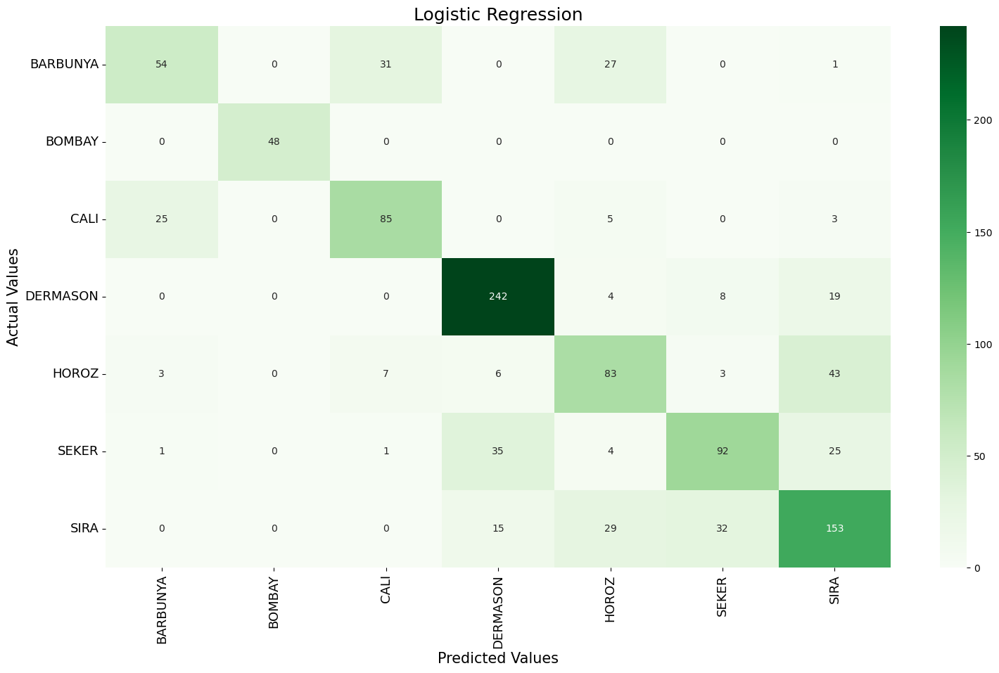

In [18]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression")

⦿ Model performance was highest on BOMBAY  
⦿ Model accuracy is 70%

### ✲ Using Oversampled dataset

Next, the validation and train dataset would be oversampled to balance it.

In [21]:
#Training with the oversampled train dataset
logreg.fit(bean_feat_train_OS, bean_label_train_OS)

LogisticRegression()

In [22]:
#Predicting with test dataset
logreg_pred = logreg.predict(bean_feat_val)
print(classification_report(bean_label_val, logreg_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.64      0.59      0.61       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.73      0.68      0.70       118
    DERMASON       0.86      0.82      0.84       273
       HOROZ       0.53      0.66      0.59       145
       SEKER       0.63      0.70      0.66       158
        SIRA       0.65      0.59      0.61       229

    accuracy                           0.70      1084
   macro avg       0.72      0.72      0.72      1084
weighted avg       0.71      0.70      0.70      1084



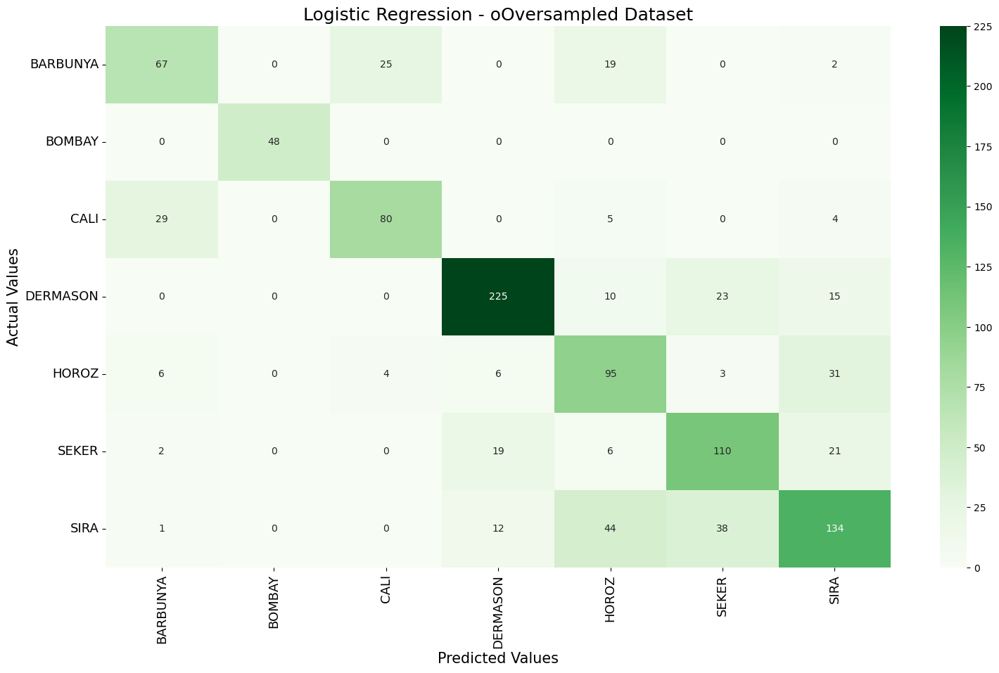

In [23]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - oOversampled Dataset")

⦿ Oversampling did not impact the result greatly.
So oversampling this dataset doesn't have an effect on this model.  
⦿ The imbalanced data would be used for hyperparameter tuning

### ✲ Using Scaled dataset

In [25]:
#Training with scaled imbalanced dataset
logreg.fit(bean_feat_train_scaled, bean_label_train)

LogisticRegression()

In [26]:
logreg_pred = logreg.predict(bean_feat_val_scaled)
print(classification_report(bean_label_val, logreg_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.92       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.92      0.92      0.92       118
    DERMASON       0.92      0.90      0.91       273
       HOROZ       0.92      0.98      0.95       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.85      0.89      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



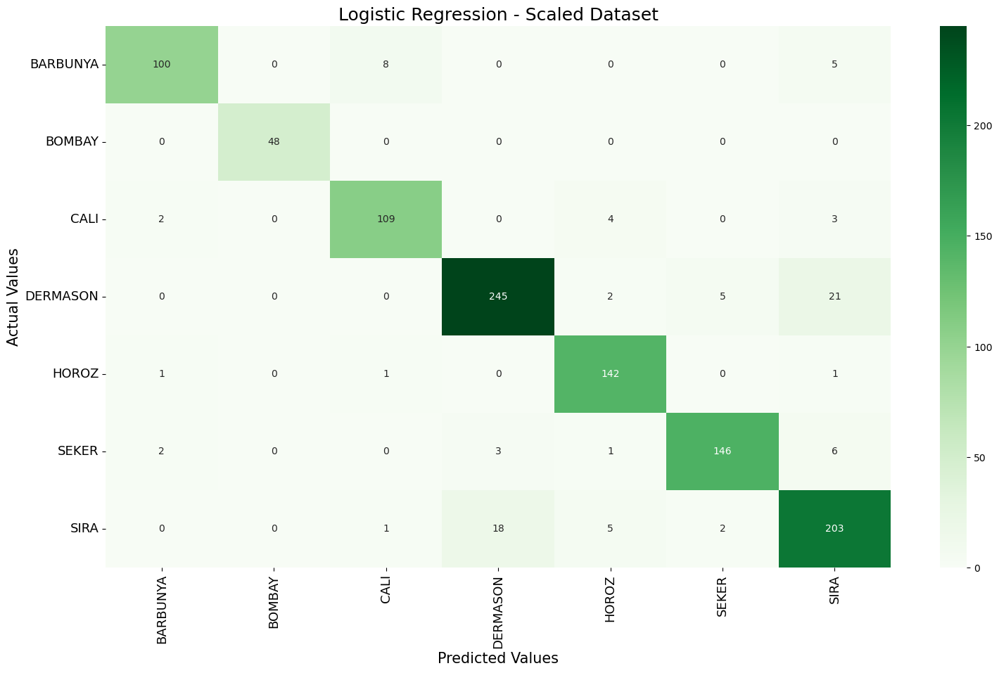

In [27]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Scaled Dataset")

⦿ Model performance significantly increased after scaling.  
⦿ Features with higher scales like Area, ConvexArea, Perimeter, etc aren't dominating the learning process. This made it easier for the model to learn relationships.

### ✲ Using Scaled - oversampled data

In [29]:
#Training with scaled balanced dataset
logreg.fit(bean_feat_train_scaledOS, bean_label_train_OS)

LogisticRegression()

In [30]:
logreg_pred = logreg.predict(bean_feat_val_scaled)
print(classification_report(bean_label_val, logreg_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.68      0.88      0.76       113
      BOMBAY       0.81      1.00      0.90        48
        CALI       0.53      0.94      0.67       118
    DERMASON       1.00      0.70      0.83       273
       HOROZ       0.93      0.81      0.87       145
       SEKER       0.92      0.89      0.90       158
        SIRA       0.65      0.56      0.60       229

    accuracy                           0.77      1084
   macro avg       0.79      0.83      0.79      1084
weighted avg       0.81      0.77      0.78      1084



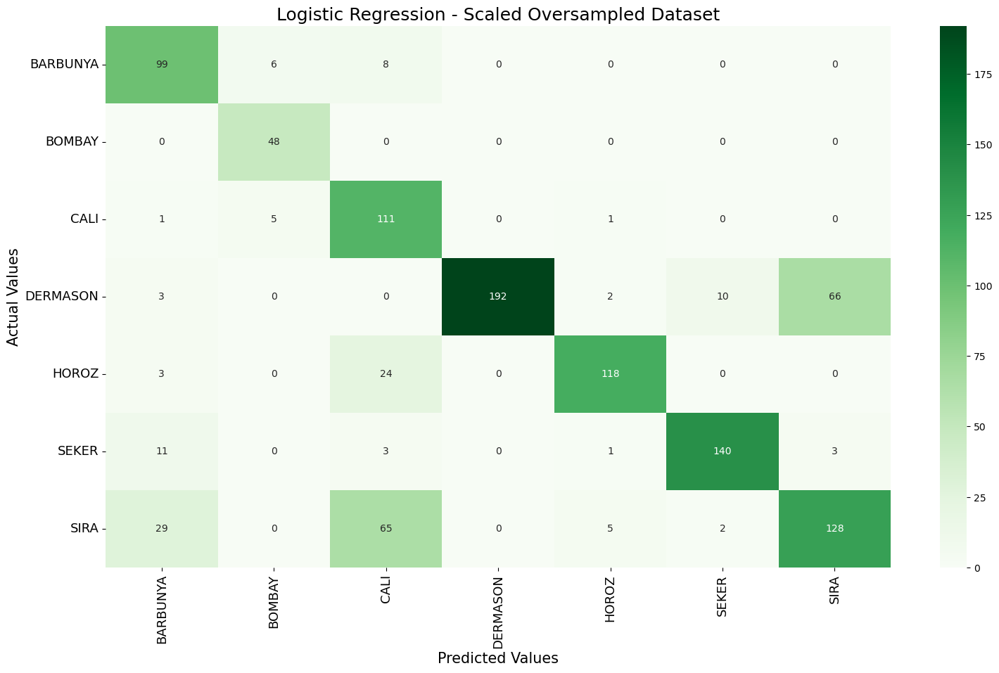

In [31]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Scaled Oversampled Dataset")

⦿ Oversampling did not impact the result greatly.  
⦿ Hence, hyperparameter tuning would be done using unscaled and scaled datasets.

---

### ✲ Hyperparameter Tuning with unscaled Dataset

The following hyperparameters would now be tuned on the unscaled dataset:  
⦿ C  
⦿ penalty  
⦿ solver  
⦿ max_iter  

##### ⦿ C(Regularization parameter)

In [32]:
logreg = LogisticRegression()

#Setting up different C values to test with
grid_c = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

#Creating a GridSearch instance
grid_search_c = GridSearchCV(logreg, param_grid=grid_c, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_c.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_serach_c
results = grid_search_c.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)

#Getting the best C
best_param_c = grid_search_c.best_params_
print("Best Hyperparameter-C:", best_param_c)

#Setting the best C into the model logreg
best_model = grid_search_c.best_estimator_

#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'C': 0.001}, {'C': 0.01}, {'C': 0.1}, {'C': 1}, {'C': 10}, {'C': 100}]
Accuracy scores: [0.71574742 0.71760797 0.71752784 0.71633928 0.71559208 0.71560657]
Best Hyperparameter-C: {'C': 0.01}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.66      0.49      0.56       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.69      0.73      0.71       118
    DERMASON       0.81      0.89      0.85       273
       HOROZ       0.55      0.57      0.56       145
       SEKER       0.68      0.58      0.63       158
        SIRA       0.63      0.67      0.65       229

    accuracy                           0.70      1084
   macro avg       0.72      0.70      0.71      1084
weighted avg       0.70      0.70      0.70      1084



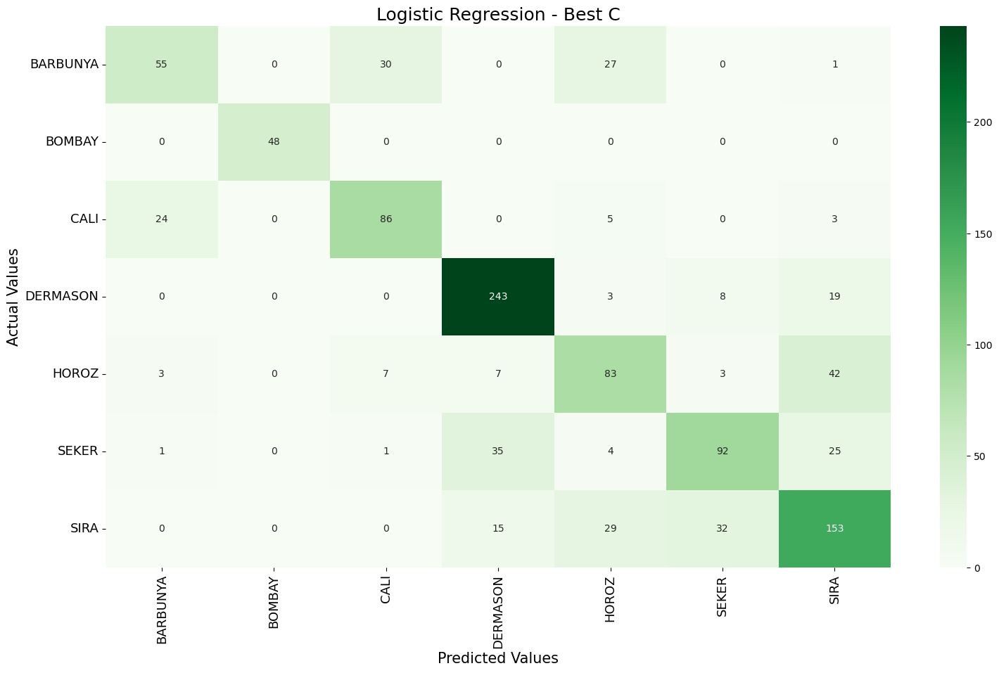

In [33]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best C")

⦿ Best C = 0.01.  
⦿ Tuning C had no significant effect on the model.

##### ⦿ penalty(Reguralization)

In [34]:
logreg = LogisticRegression()

#Setting up different penalty values to test with
grid_penalty = {'penalty': ["l1", "l2"]}

#Creating a GridSearch instance
grid_search_penalty = GridSearchCV(logreg, param_grid=grid_penalty, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_penalty.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_serach_penalty
results = grid_search_penalty.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best penalty
best_param_penalty = grid_search_penalty.best_params_
print("Best Hyperparameter-penalty:", best_param_penalty)


#Setting up the model with the best penalty
best_model = grid_search_penalty.best_estimator_

#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'penalty': 'l1'}, {'penalty': 'l2'}]
Accuracy scores: [       nan 0.71633928]
Best Hyperparameter-penalty: {'penalty': 'l2'}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.65      0.48      0.55       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.69      0.72      0.70       118
    DERMASON       0.81      0.89      0.85       273
       HOROZ       0.55      0.57      0.56       145
       SEKER       0.68      0.58      0.63       158
        SIRA       0.63      0.67      0.65       229

    accuracy                           0.70      1084
   macro avg       0.71      0.70      0.70      1084
weighted avg       0.70      0.70      0.69      1084



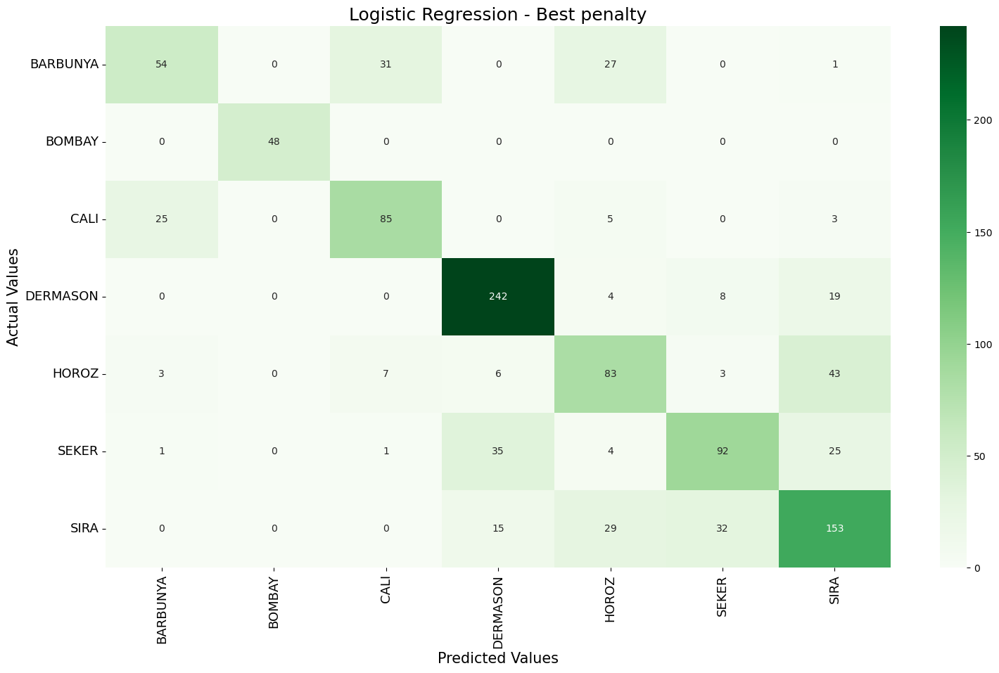

In [35]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best penalty")

⦿ Best penalty = "l2".  
⦿ Tunning penalty had no significant effect on the model.  
However...  
⦿ Default solver "lbfgs" does not support "l1".  
⦿ "l1" and "l2" comparison would now be implemented with "liblinear"

In [36]:
logreg = LogisticRegression(penalty='l1', solver='liblinear')

#Performing 5-fold cross validation
#This was done by GridsearchCV in preveious parameter tuning
scores = cross_val_score(logreg, bean_feat_train, bean_label_train, cv=5)

print("Cross-Validation Scores:", scores)

print("Mean Cross-Validation Score:", scores.mean())

#Fiting logreg on the scaled train data
logreg.fit(bean_feat_train, bean_label_train)

#Evaluating the model's perfomance on the validation data
logreg_pred = logreg.predict(bean_feat_val)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Cross-Validation Scores: [0.90615385 0.90051282 0.89589744 0.91384615 0.91333333]
Mean Cross-Validation Score: 0.905948717948718
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.84      0.88       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.91      0.89      0.90       118
    DERMASON       0.92      0.90      0.91       273
       HOROZ       0.93      0.94      0.93       145
       SEKER       0.94      0.92      0.93       158
        SIRA       0.81      0.89      0.85       229

    accuracy                           0.90      1084
   macro avg       0.92      0.91      0.91      1084
weighted avg       0.90      0.90      0.90      1084



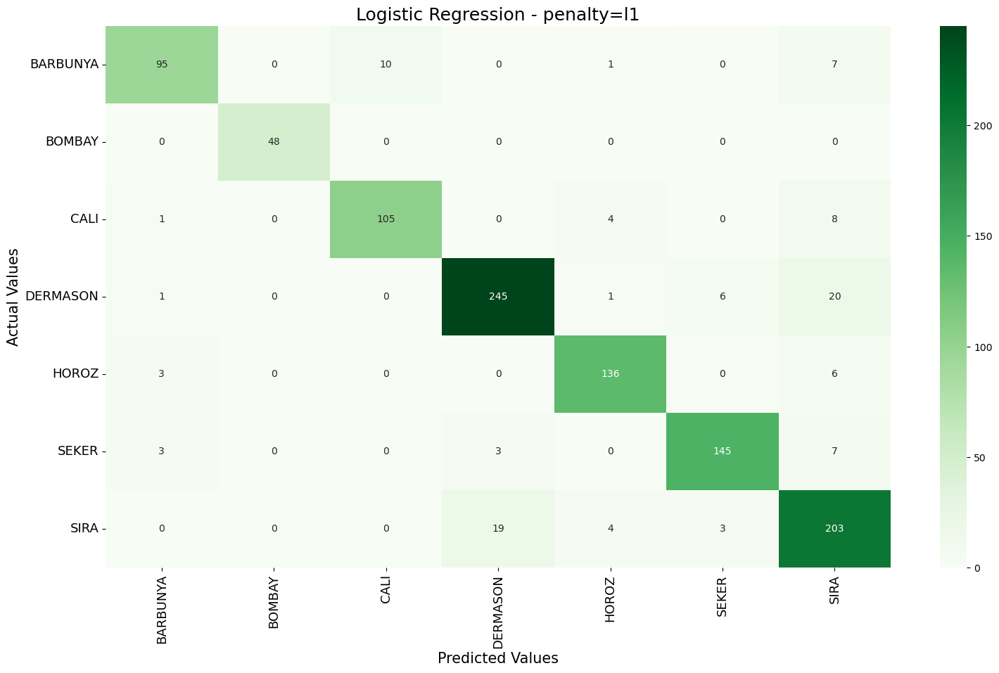

In [37]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - penalty=l1")

In [38]:
logreg = LogisticRegression(penalty='l2', solver='liblinear')

#Performing 5-fold cross validation
#This was done by GridsearchCV in preveious parameter tuning
scores = cross_val_score(logreg, bean_feat_train, bean_label_train, cv=5)

print("Cross-Validation Scores:", scores)

print("Mean Cross-Validation Score:", scores.mean())

#Fiting logreg on the scaled train data
logreg.fit(bean_feat_train, bean_label_train)

#Evaluating the model's perfomance on the validation data
logreg_pred = logreg.predict(bean_feat_val)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Cross-Validation Scores: [0.87025641 0.86205128 0.8625641  0.87025641 0.87384615]
Mean Cross-Validation Score: 0.8677948717948716
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.90      0.82      0.86       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.92      0.68      0.78       118
    DERMASON       0.87      0.91      0.89       273
       HOROZ       0.90      0.94      0.92       145
       SEKER       0.95      0.91      0.93       158
        SIRA       0.74      0.83      0.78       229

    accuracy                           0.87      1084
   macro avg       0.90      0.87      0.88      1084
weighted avg       0.87      0.87      0.87      1084



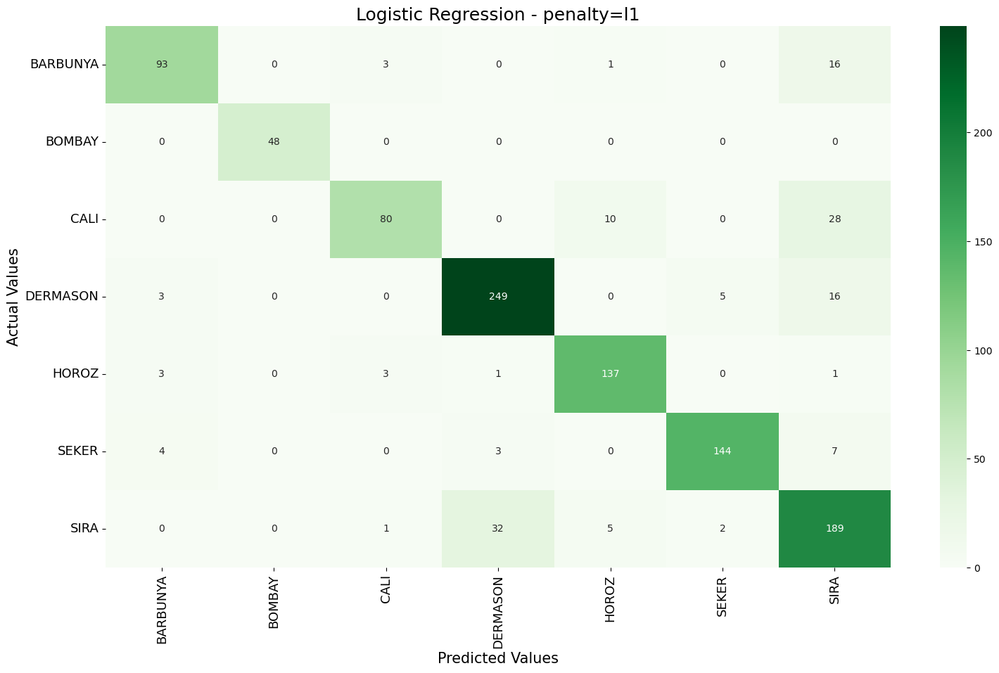

In [39]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - penalty=l1")

⦿ "l1" acheived a better result with "liblinear".  
⦿ This combination would used when combining all parameters

##### ⦿ max_iter(Maximum iteration allowed for solver to converge)

In [40]:
logreg = LogisticRegression()

#Setting up different max_iter values to train with
grid_iter = {'max_iter': [100, 1000, 10000]}

#Creating a GridSearch instance
grid_search_iter = GridSearchCV(logreg, param_grid=grid_iter, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_iter.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_serach_iter
results = grid_search_iter.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best max_iter
best_param_iter = grid_search_iter.best_params_
print("Best Hyperparameter-max_iter:", best_param_iter)

#Setting the best C into the model logreg
best_model = grid_search_iter.best_estimator_


#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val)

#Cheching iteration where convergence was achieved
convergence_iter = best_model.n_iter_[0]
print("Convergence Iteration:", convergence_iter)

print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'max_iter': 100}, {'max_iter': 1000}, {'max_iter': 10000}]
Accuracy scores: [0.71633928 0.87699298 0.92580053]
Best Hyperparameter-max_iter: {'max_iter': 10000}
Convergence Iteration: 7513
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.85      0.89       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.90      0.92      0.91       118
    DERMASON       0.91      0.92      0.91       273
       HOROZ       0.92      0.95      0.94       145
       SEKER       0.94      0.92      0.93       158
        SIRA       0.85      0.86      0.86       229

    accuracy                           0.91      1084
   macro avg       0.92      0.92      0.92      1084
weighted avg       0.91      0.91      0.91      1084



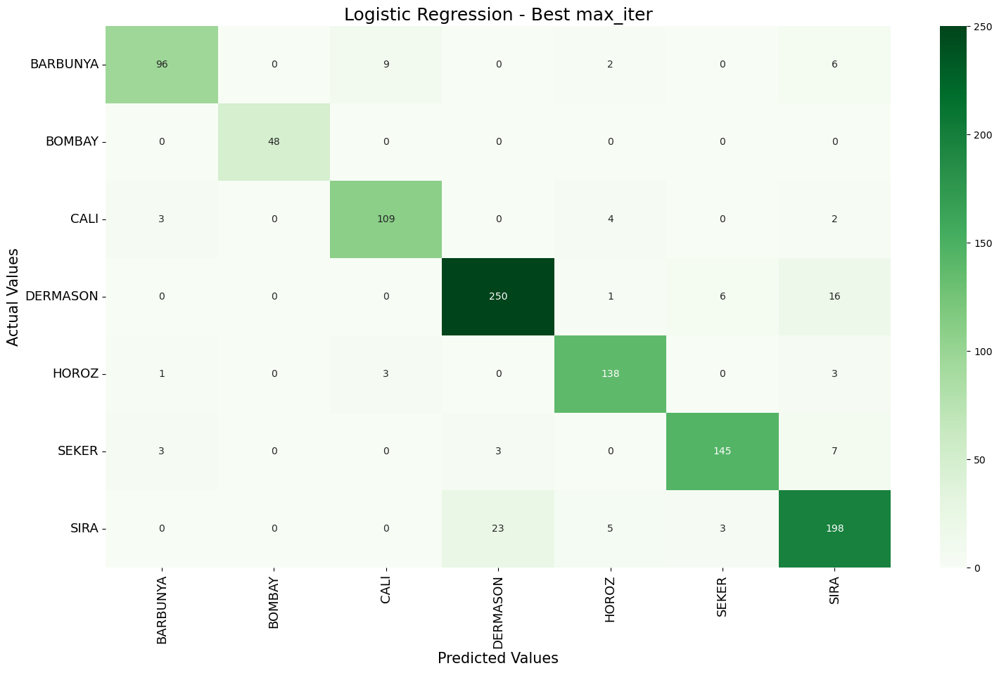

In [41]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best max_iter")

### ⦿ Finding the best combined parameters

⦿ Using penalty="l1" and solver="liblinear" as this combination had the best effect on the model.  
⦿ Combining selected penalty and solver with best max_iter and C

In [42]:
logreg = LogisticRegression(penalty="l1", solver="liblinear")

#Setting up different hyperparameters to test with
param_grid = {
    'max_iter': [100, 1000, 10000],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
}

#Creating a GridSearch instance
grid_search = GridSearchCV(logreg, param_grid=param_grid, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_search
results = grid_search.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scores
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)

#Getting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

#Setting the best hyperparameters into the model
best_model = grid_search.best_estimator_

#Evaluating the model's performance on the validation data
logreg_pred = best_model.predict(bean_feat_val)

#Checking iteration where convergence was achieved
convergence_iter = best_model.n_iter_[0]
print("Convergence Iteration:", convergence_iter)

print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))


Grid Search Results:
[{'C': 0.001, 'max_iter': 100}, {'C': 0.001, 'max_iter': 1000}, {'C': 0.001, 'max_iter': 10000}, {'C': 0.01, 'max_iter': 100}, {'C': 0.01, 'max_iter': 1000}, {'C': 0.01, 'max_iter': 10000}, {'C': 0.1, 'max_iter': 100}, {'C': 0.1, 'max_iter': 1000}, {'C': 0.1, 'max_iter': 10000}, {'C': 1, 'max_iter': 100}, {'C': 1, 'max_iter': 1000}, {'C': 1, 'max_iter': 10000}, {'C': 10, 'max_iter': 100}, {'C': 10, 'max_iter': 1000}, {'C': 10, 'max_iter': 10000}, {'C': 100, 'max_iter': 100}, {'C': 100, 'max_iter': 1000}, {'C': 100, 'max_iter': 10000}]
Accuracy scores: [0.89370554 0.88701454 0.88706592 0.90976708 0.911289   0.91102483
 0.91795245 0.92019502 0.91991372 0.91991492 0.92336148 0.92387664
 0.9210759  0.92414507 0.92408237 0.92048923 0.92464795 0.92485655]
Best Hyperparameters: {'C': 100, 'max_iter': 10000}
Convergence Iteration: 409
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.86      0.89       1

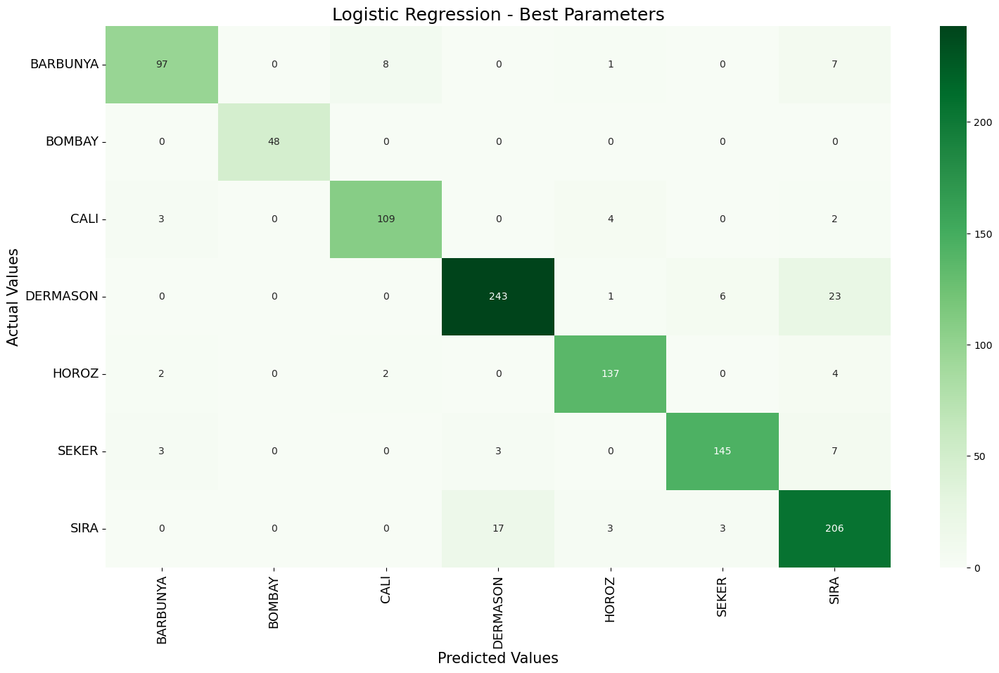

In [43]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best Parameters")

---

### ✲ Hyperparameter Tuning with Scaled Dataset

The following hyperparameters would now be tuned on the scaled dataset:  
⦿ C  
⦿ penalty  
⦿ solver  
⦿ max_iter  

##### ⦿ C(Strength of Regularization)

In [44]:
logreg = LogisticRegression()

#Setting up different C values to test with
grid_c = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

#Creating a GridSearch instance
grid_search_c = GridSearchCV(logreg, param_grid=grid_c, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_c.fit(bean_feat_train_scaled, bean_label_train)

#Getting the results from grid_serach_c
results = grid_search_c.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)

#Getting the best C
best_param_c = grid_search_c.best_params_
print("Best Hyperparameter-C:", best_param_c)

#Setting the best C into the model logreg
best_model = grid_search_c.best_estimator_

#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val_scaled)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'C': 0.001}, {'C': 0.01}, {'C': 0.1}, {'C': 1}, {'C': 10}, {'C': 100}]
Accuracy scores: [0.90169353 0.93092932 0.93638767 0.9378929  0.93750229 0.93743863]
Best Hyperparameter-C: {'C': 1}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.92       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.92      0.92      0.92       118
    DERMASON       0.92      0.90      0.91       273
       HOROZ       0.92      0.98      0.95       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.85      0.89      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



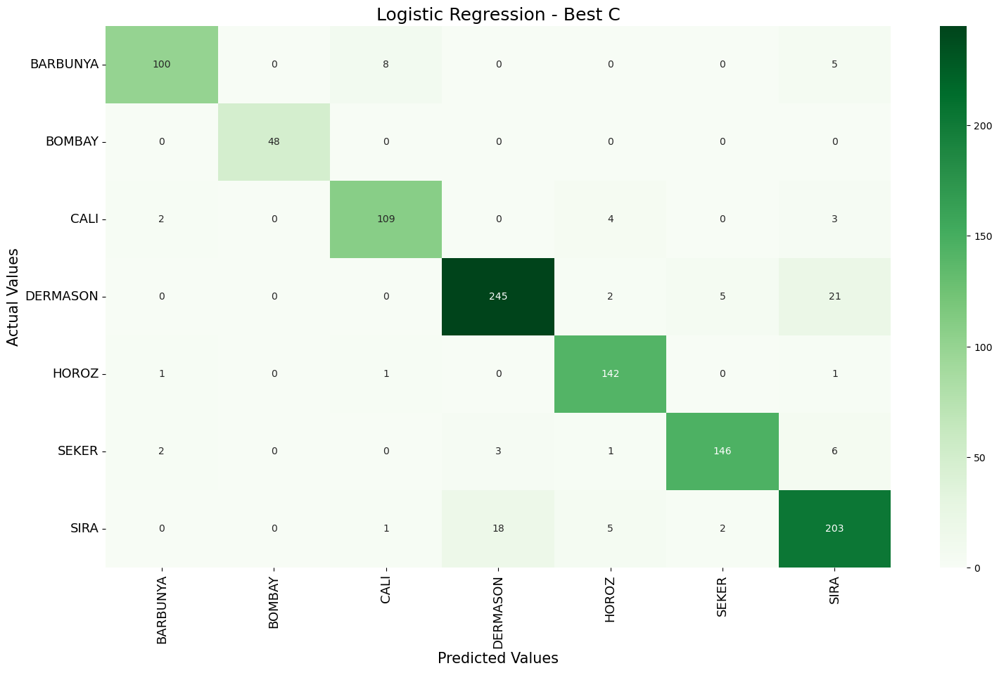

In [45]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best C")

⦿ C has had no effect on the Model as the best C is the default C=1

##### ⦿ penalty(Reguralization)

In [46]:
logreg = LogisticRegression()

#Setting up different penalty values to test with
grid_penalty = {'penalty': ["l1", "l2"]}

#Creating a GridSearch instance
grid_search_penalty = GridSearchCV(logreg, param_grid=grid_penalty, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_penalty.fit(bean_feat_train_scaled, bean_label_train)

#Getting the results from grid_serach_penalty
results = grid_search_penalty.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best penalty
best_param_penalty = grid_search_penalty.best_params_
print("Best Hyperparameter-penalty:", best_param_penalty)


#Setting up the model with the best penalty
best_model = grid_search_penalty.best_estimator_

#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val_scaled)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'penalty': 'l1'}, {'penalty': 'l2'}]
Accuracy scores: [      nan 0.9378929]
Best Hyperparameter-penalty: {'penalty': 'l2'}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.92       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.92      0.92      0.92       118
    DERMASON       0.92      0.90      0.91       273
       HOROZ       0.92      0.98      0.95       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.85      0.89      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



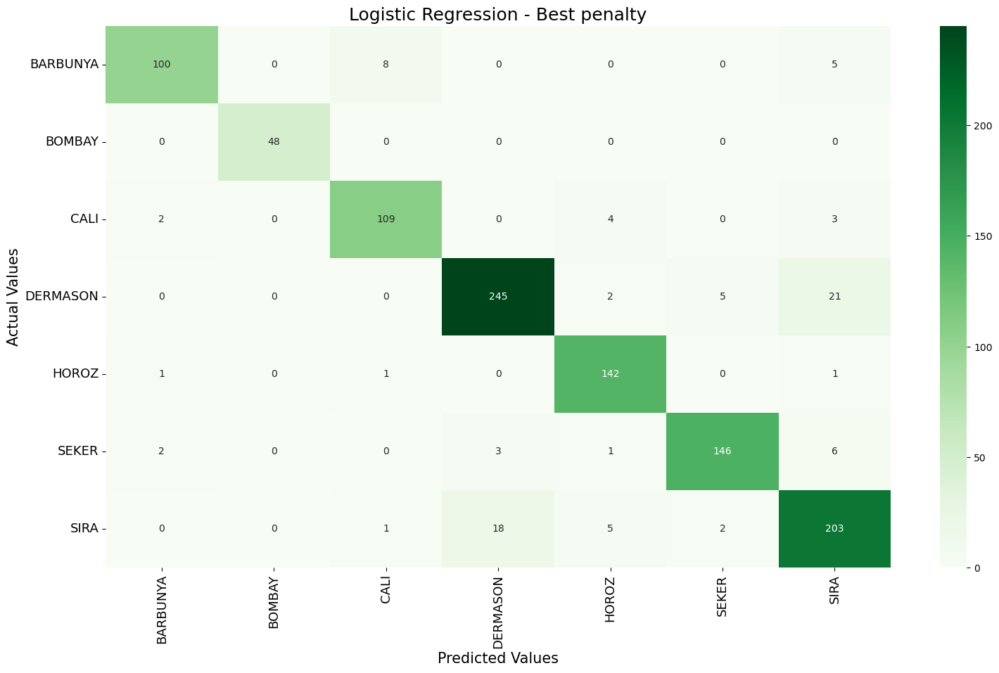

In [47]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best penalty")

---

⦿ Solver would now be set to "liblinear" as default solver "lbfgs" cannot use "l1" reguralization.

In [48]:
logreg = LogisticRegression(penalty='l1', solver='liblinear')

#Performing 5-fold cross validation
#This was done by GridsearchCV in preveious parameter tuning
scores = cross_val_score(logreg, bean_feat_train_scaled, bean_label_train, cv=5)

print("Cross-Validation Scores:", scores)

print("Mean Cross-Validation Score:", scores.mean())

#Fiting logreg on the scaled train data
logreg.fit(bean_feat_train_scaled, bean_label_train)

#Evaluating the model's perfomance on the validation data
logreg_pred = logreg.predict(bean_feat_val_scaled)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Cross-Validation Scores: [0.91948718 0.91641026 0.91282051 0.93128205 0.93025641]
Mean Cross-Validation Score: 0.9220512820512822
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.84      0.90       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.91      0.92      0.91       118
    DERMASON       0.93      0.90      0.92       273
       HOROZ       0.92      0.97      0.94       145
       SEKER       0.95      0.92      0.93       158
        SIRA       0.84      0.91      0.87       229

    accuracy                           0.91      1084
   macro avg       0.93      0.92      0.92      1084
weighted avg       0.92      0.91      0.91      1084



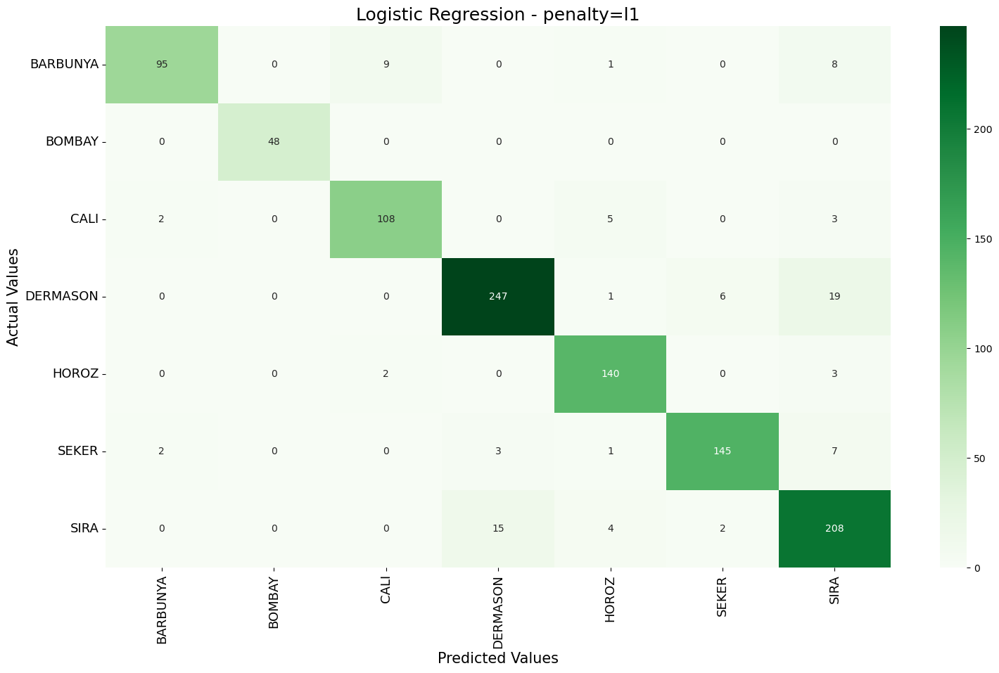

In [49]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - penalty=l1")

⦿ Solver set to "liblinear" as default solver "" cannot use "l1" reguralization

In [50]:
logreg = LogisticRegression(penalty='l2', solver='liblinear')

#Performing 5-fold cross validation
#This was done by GridsearchCV in preveious parameter tuning
scores = cross_val_score(logreg, bean_feat_train_scaled, bean_label_train, cv=5)

print("Cross-Validation Scores:", scores)

print("Mean Cross-Validation Score:", scores.mean())

#Fiting logreg on the scaled train data
logreg.fit(bean_feat_train_scaled, bean_label_train)

#Evaluating the model's perfomance on the validation data
logreg_pred = logreg.predict(bean_feat_val_scaled)
print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Cross-Validation Scores: [0.91333333 0.90923077 0.90923077 0.92820513 0.92615385]
Mean Cross-Validation Score: 0.9172307692307692
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.86      0.90       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.93      0.92      0.93       118
    DERMASON       0.93      0.89      0.91       273
       HOROZ       0.92      0.97      0.94       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.83      0.91      0.87       229

    accuracy                           0.91      1084
   macro avg       0.93      0.92      0.93      1084
weighted avg       0.92      0.91      0.91      1084



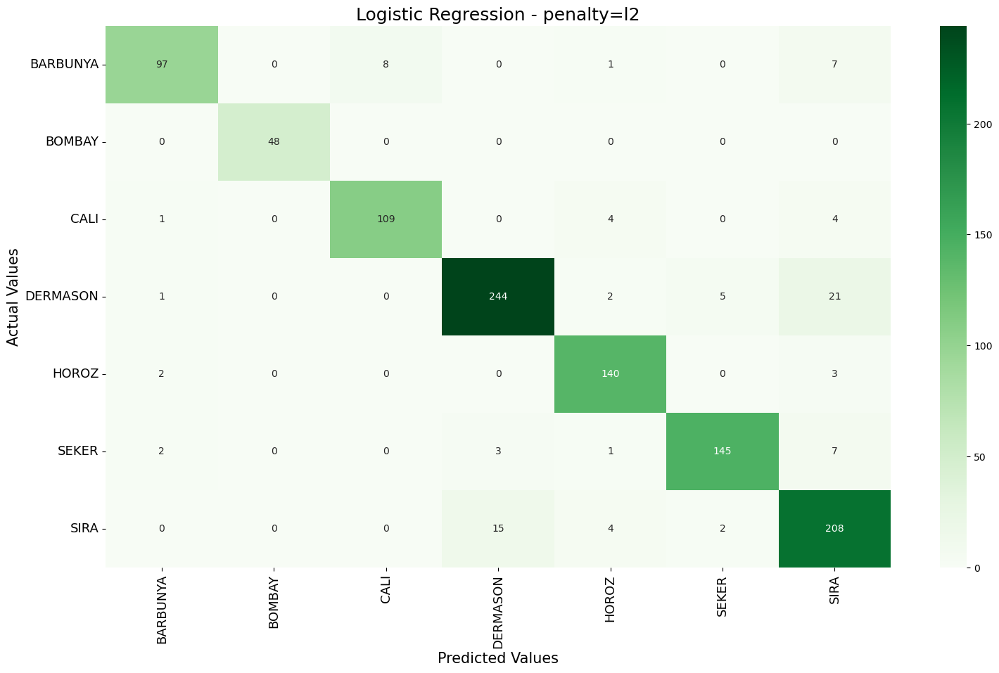

In [51]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - penalty=l2")

⦿ Default penalty="l2" and solver="lbfgs" had the best performance.  
⦿ To be used when combining all parameters

##### ⦿ max_iter(Maximum iteration allowed for solver to converge)

In [52]:
logreg = LogisticRegression()

#Setting up different max_iter values to train with
grid_iter = {'max_iter': [100, 1000, 10000]}

#Creating a GridSearch instance
grid_search_iter = GridSearchCV(logreg, param_grid=grid_iter, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_iter.fit(bean_feat_train_scaled, bean_label_train)

#Getting the results from grid_serach_iter
results = grid_search_iter.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best max_iter
best_param_iter = grid_search_iter.best_params_
print("Best Hyperparameter-max_iter:", best_param_iter)

#Setting the best C into the model logreg
best_model = grid_search_iter.best_estimator_


#Evaluating the model's perfomance on the validation data
logreg_pred = best_model.predict(bean_feat_val_scaled)

#Cheching iteration where convergence was achieved
convergence_iter = best_model.n_iter_[0]
print("Convergence Iteration:", convergence_iter)

print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'max_iter': 100}, {'max_iter': 1000}, {'max_iter': 10000}]
Accuracy scores: [0.9378929  0.93784512 0.93784512]
Best Hyperparameter-max_iter: {'max_iter': 100}
Convergence Iteration: 100
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.92       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.92      0.92      0.92       118
    DERMASON       0.92      0.90      0.91       273
       HOROZ       0.92      0.98      0.95       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.85      0.89      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



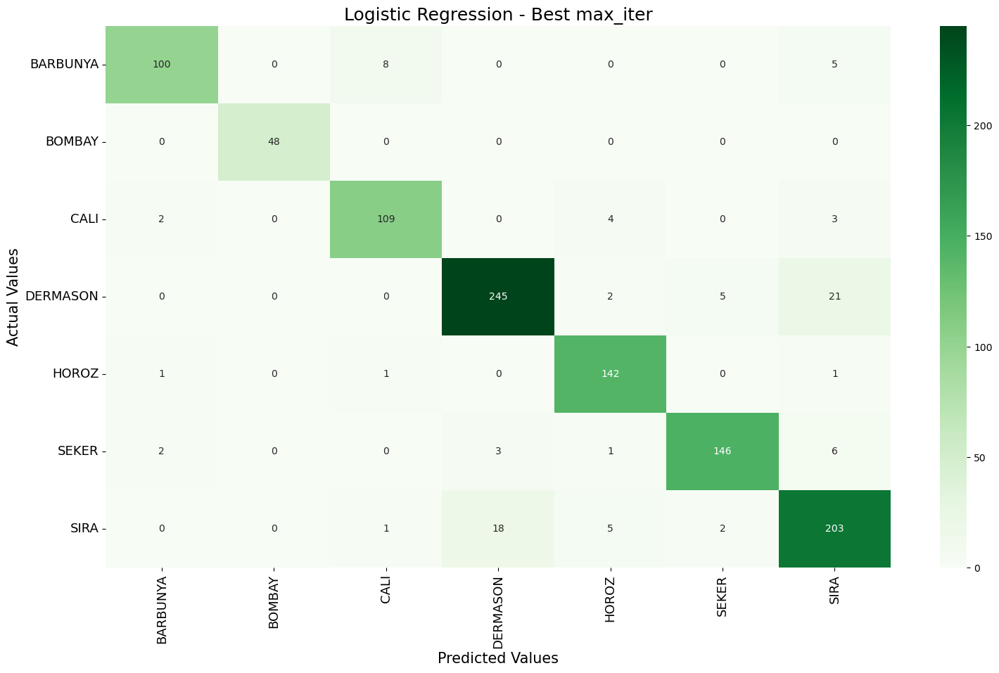

In [53]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best max_iter")

### ⦿ Finding the best combined parameters

⦿ Using penalty="lbfgs" and penalty=l2 with best max_iter and C combination

In [54]:
logreg = LogisticRegression()

#Setting up different hyperparameters to test with
param_grid = {
    'max_iter': [100, 1000, 10000],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
}

#Creating a GridSearch instance
grid_search = GridSearchCV(logreg, param_grid=param_grid, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search.fit(bean_feat_train_scaled, bean_label_train)

#Getting the results from grid_search
results = grid_search.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scores
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)

#Getting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

#Setting the best hyperparameters into the model
best_model = grid_search.best_estimator_

#Evaluating the model's performance on the validation data
logreg_pred = best_model.predict(bean_feat_val_scaled)

#Checking iteration where convergence was achieved
convergence_iter = best_model.n_iter_[0]
print("Convergence Iteration:", convergence_iter)

print("Validation Classification Report:")
print(classification_report(bean_label_val, logreg_pred))

Grid Search Results:
[{'C': 0.001, 'max_iter': 100}, {'C': 0.001, 'max_iter': 1000}, {'C': 0.001, 'max_iter': 10000}, {'C': 0.01, 'max_iter': 100}, {'C': 0.01, 'max_iter': 1000}, {'C': 0.01, 'max_iter': 10000}, {'C': 0.1, 'max_iter': 100}, {'C': 0.1, 'max_iter': 1000}, {'C': 0.1, 'max_iter': 10000}, {'C': 1, 'max_iter': 100}, {'C': 1, 'max_iter': 1000}, {'C': 1, 'max_iter': 10000}, {'C': 10, 'max_iter': 100}, {'C': 10, 'max_iter': 1000}, {'C': 10, 'max_iter': 10000}, {'C': 100, 'max_iter': 100}, {'C': 100, 'max_iter': 1000}, {'C': 100, 'max_iter': 10000}]
Accuracy scores: [0.90169353 0.90169353 0.90169353 0.93092932 0.93092932 0.93092932
 0.93638767 0.93638767 0.93638767 0.9378929  0.93784512 0.93784512
 0.93750229 0.93805954 0.93805954 0.93743863 0.93730468 0.93721662]
Best Hyperparameters: {'C': 10, 'max_iter': 1000}
Convergence Iteration: 613
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.89      0.93       113

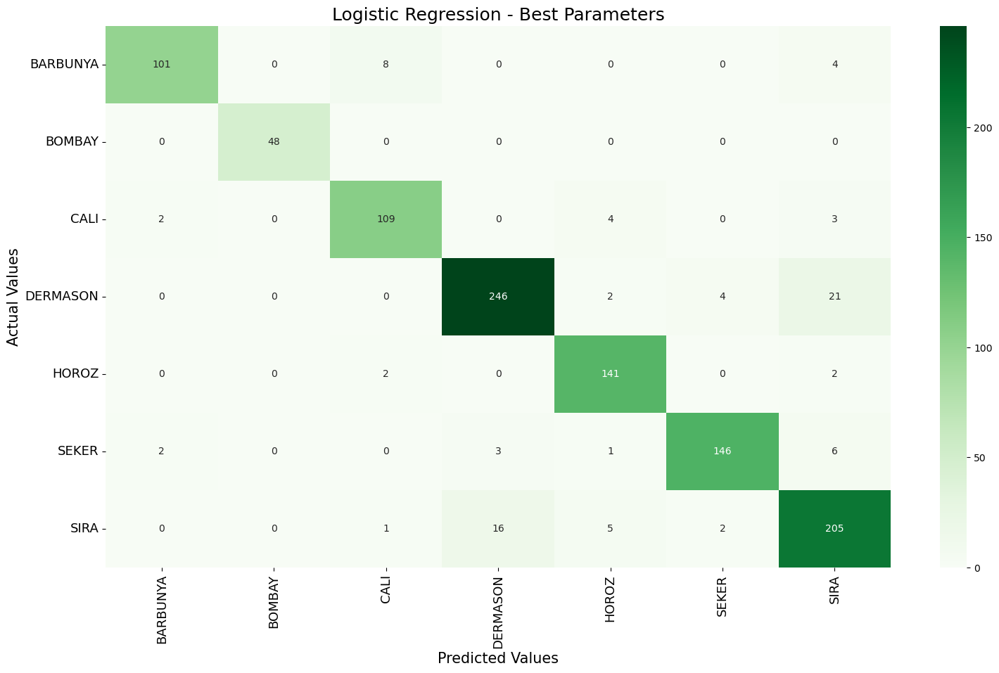

In [55]:
plot_confusion_matrix(bean_label_val, logreg_pred,"Logistic Regression - Best Parameters")

### ⦿ Final Logistic Regression Model

⦿ Using the scaled dataset, the final Logistic Regression model would be built with the following hyperparameters;

⦿ C = 10  
⦿ max_iter = 1000  
⦿ penalty = "l2"  
⦿ solver = "lbfgs"  

⦿ This would now be tested with the scaled test data

In [77]:
#Creating final Logistic Regression model
logreg = LogisticRegression(C=10, max_iter=1000)

logreg.fit(bean_feat_train_scaled, bean_label_train)

LogisticRegression(C=10, max_iter=1000)

In [78]:
logreg_pred = logreg.predict(bean_feat_test_scaled)
print(classification_report(bean_label_test, logreg_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.91      0.86      0.89       244
      BOMBAY       1.00      1.00      1.00        92
        CALI       0.90      0.94      0.92       324
    DERMASON       0.93      0.92      0.92       713
       HOROZ       0.94      0.95      0.95       356
       SEKER       0.97      0.94      0.95       446
        SIRA       0.87      0.89      0.88       534

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



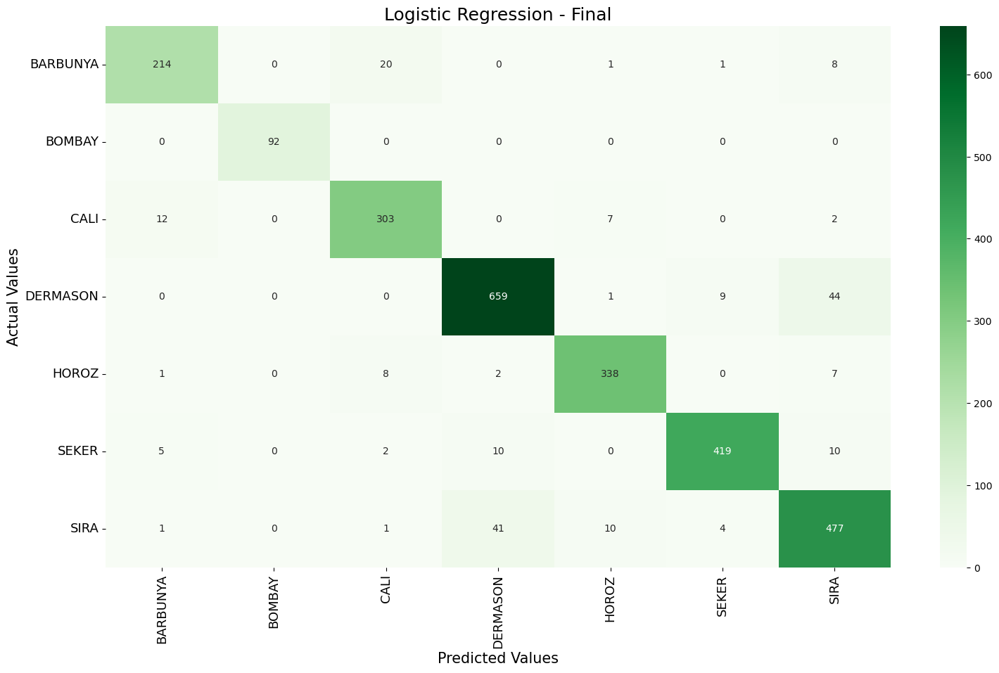

In [58]:
plot_confusion_matrix(bean_label_test, logreg_pred,"Logistic Regression - Final")

⦿ Final model had 92% Accuracy and 93% F1 Score.  
⦿ This is consistent with the final model performance on the validation dataset.

## Supplementary Model - Random Forest Classifier

### ✲ Using original dataset(imbalanced and unscaled)

⦿ Starting with imbalanced, unscaled data and default model hyperparameters

In [79]:
#Creating a Random Forest Classifier model instance
rfc = RandomForestClassifier()

#Fitting the model on the train data
rfc.fit(bean_feat_train, bean_label_train)

RandomForestClassifier()

In [80]:
#Evaluating model with validation data
rfc_pred = rfc.predict(bean_feat_val)
print(classification_report(bean_label_val, rfc_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.98      0.88      0.93       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.91      0.93      0.92       118
    DERMASON       0.90      0.92      0.91       273
       HOROZ       0.93      0.94      0.94       145
       SEKER       0.94      0.94      0.94       158
        SIRA       0.87      0.87      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



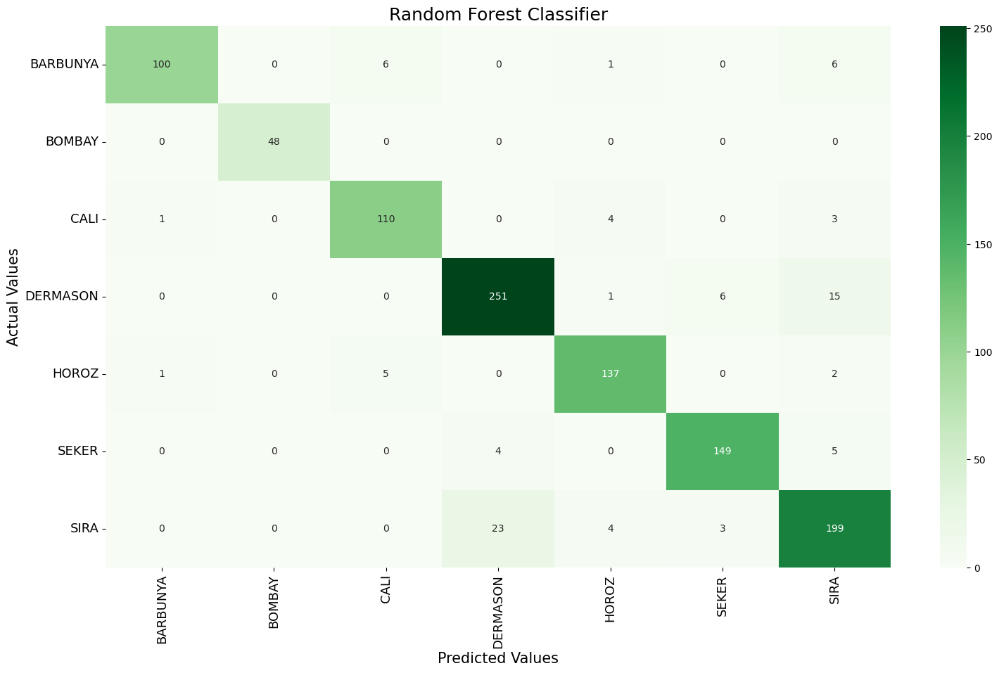

In [81]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier")

### ✲ Using Oversampled dataset

In [62]:
#Fitting the model on the oversampled train data
rfc.fit(bean_feat_train_OS, bean_label_train_OS)

RandomForestClassifier()

In [63]:
#Evaluating model with validation data
rfc_pred = rfc.predict(bean_feat_val)
print(classification_report(bean_label_val, rfc_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.98      0.88      0.93       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.90      0.95      0.92       118
    DERMASON       0.91      0.92      0.91       273
       HOROZ       0.94      0.96      0.95       145
       SEKER       0.95      0.92      0.94       158
        SIRA       0.87      0.88      0.87       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



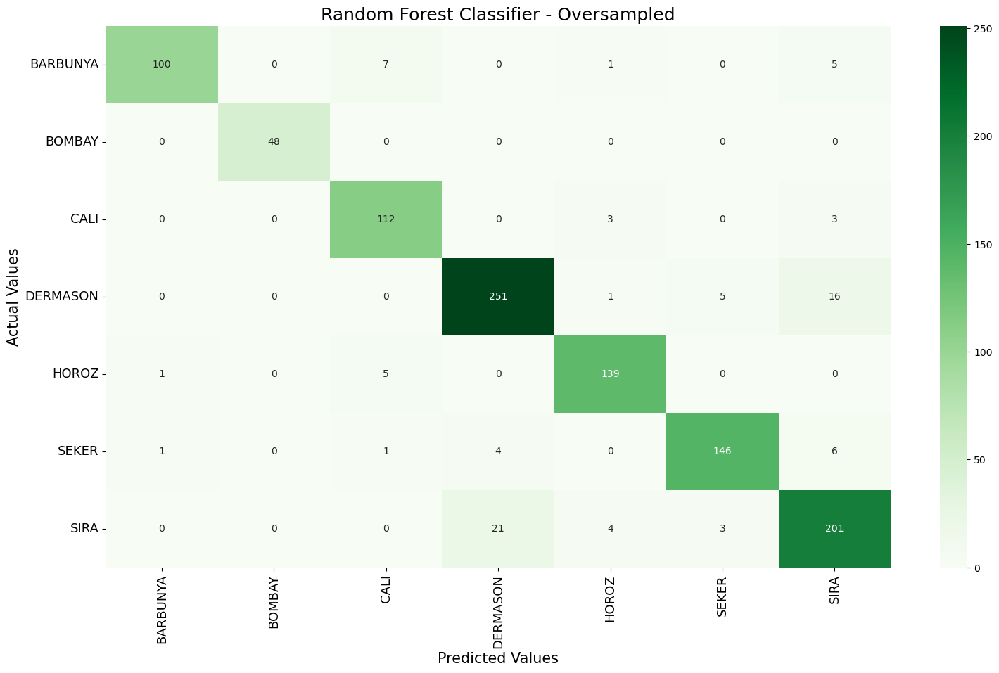

In [64]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier - Oversampled")

⦿ Oversampling had no significant effect

### ✲ Scaling the dataset

In [82]:
#Fitting the model on the scaled train data
rfc.fit(bean_feat_train_scaled, bean_label_train)

RandomForestClassifier()

In [83]:
#Evaluating model with validation data
rfc_pred = rfc.predict(bean_feat_val_scaled)
print(classification_report(bean_label_val, rfc_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.98      0.88      0.93       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.91      0.93      0.92       118
    DERMASON       0.89      0.92      0.91       273
       HOROZ       0.93      0.95      0.94       145
       SEKER       0.94      0.94      0.94       158
        SIRA       0.87      0.86      0.86       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



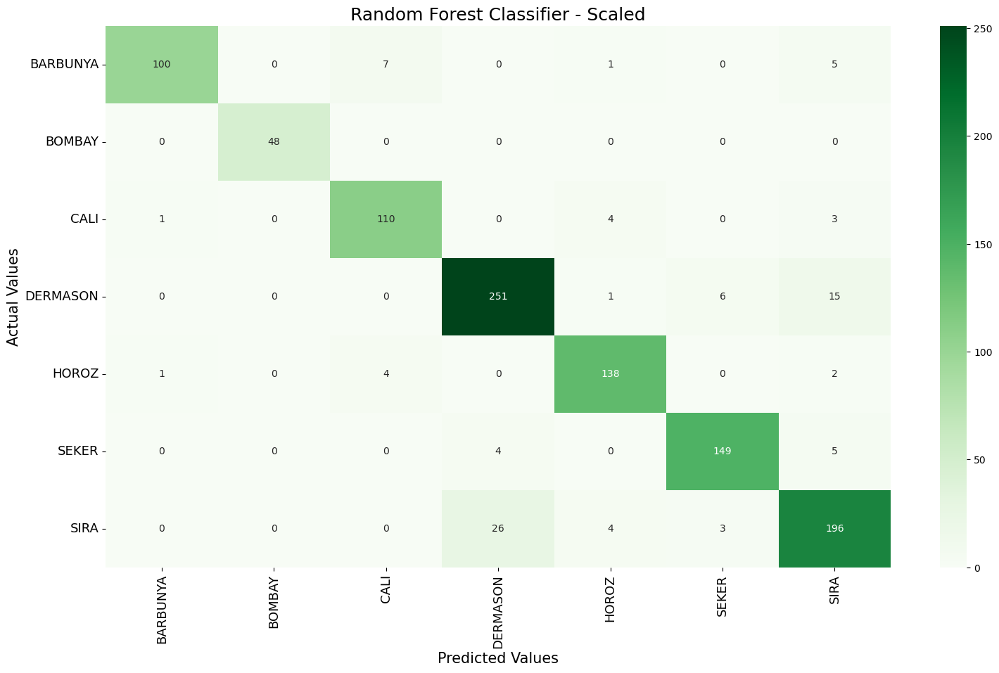

In [84]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier - Scaled")

⦿ As expected, scaling had no effect on the model  
⦿ Original imbalanced, unscaled dataset would be used moving forward

### ✲ Hyperparameter Tuning 

##### ⦿ n_estimators(number of Descision Trees)

In [86]:
rfc = RandomForestClassifier()

#Setting up different n_estimators values to train with
grid_n_estimators = {'n_estimators': [100, 200, 300, 400]}

#Creating a GridSearch instance
grid_search_n_estimators = GridSearchCV(rfc, param_grid=grid_n_estimators, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_n_estimators.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_serach_n_estimators
results = grid_search_n_estimators.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best n_estimators
best_param_n_estimators = grid_search_n_estimators.best_params_
print("Best Hyperparameter-n_estimators:", best_param_n_estimators)

#Setting the best n_estimators into the model
best_model = grid_search_n_estimators.best_estimator_


#Evaluating the model's perfomance on the validation data
rfc_pred = best_model.predict(bean_feat_val)

print("Validation Classification Report:")
print(classification_report(bean_label_val, rfc_pred))

Grid Search Results:
[{'n_estimators': 100}, {'n_estimators': 200}, {'n_estimators': 300}, {'n_estimators': 400}]
Accuracy scores: [0.9349527  0.93504994 0.93506292 0.93485963]
Best Hyperparameter-n_estimators: {'n_estimators': 300}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.99      0.87      0.92       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.90      0.93      0.92       118
    DERMASON       0.89      0.91      0.90       273
       HOROZ       0.93      0.94      0.94       145
       SEKER       0.94      0.94      0.94       158
        SIRA       0.85      0.86      0.85       229

    accuracy                           0.91      1084
   macro avg       0.93      0.92      0.93      1084
weighted avg       0.91      0.91      0.91      1084



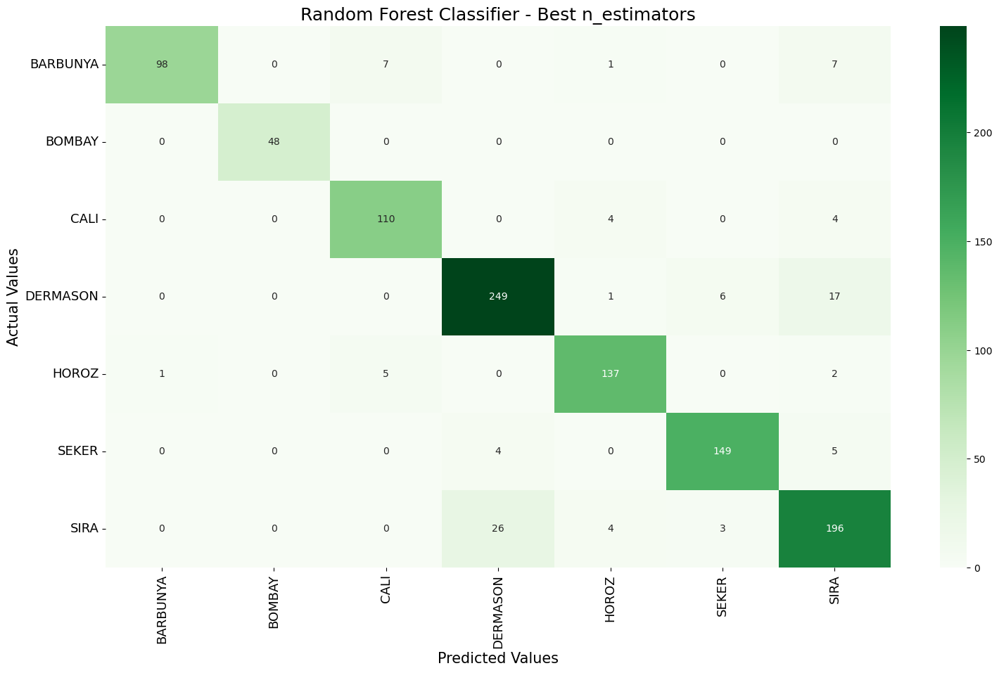

In [87]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier - Best n_estimators")

##### ⦿ max_depth(maximum depth of a decision tree)

In [70]:
rfc = RandomForestClassifier()

#Setting up different max_depth to train with
grid_max_depth = {'max_depth': [None, 5, 10, 15]}

#Creating a GridSearch instance
grid_search_max_depth = GridSearchCV(rfc, param_grid=grid_max_depth, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search_max_depth.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_serach_criterion
results = grid_search_max_depth.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)


#Getting the best n_estimators
best_param_max_depth = grid_search_max_depth.best_params_
print("Best Hyperparameter-max_depth:", best_param_max_depth)

#Setting the best max_depth in the model
best_model = grid_search_max_depth.best_estimator_


#Evaluating the model's perfomance on the validation data
rfc_pred = best_model.predict(bean_feat_val)

print("Validation Classification Report:")
print(classification_report(bean_label_val, rfc_pred))

Grid Search Results:
[{'max_depth': None}, {'max_depth': 5}, {'max_depth': 10}, {'max_depth': 15}]
Accuracy scores: [0.93479879 0.89268544 0.93399827 0.93412319]
Best Hyperparameter-max_depth: {'max_depth': None}
Validation Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.98      0.88      0.93       113
      BOMBAY       1.00      1.00      1.00        48
        CALI       0.90      0.95      0.93       118
    DERMASON       0.89      0.93      0.91       273
       HOROZ       0.94      0.94      0.94       145
       SEKER       0.95      0.94      0.94       158
        SIRA       0.87      0.85      0.86       229

    accuracy                           0.92      1084
   macro avg       0.93      0.93      0.93      1084
weighted avg       0.92      0.92      0.92      1084



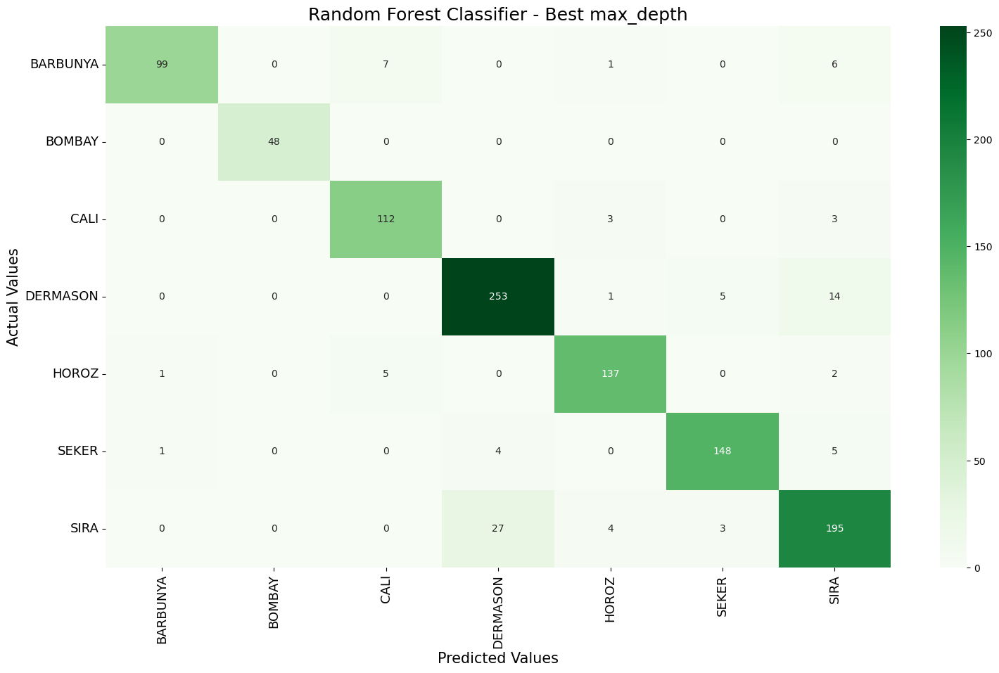

In [71]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier - Best max_depth")

Accuracy did not improve.  
F1 score reduced

### ⦿ Finding the best combined parameters

⦿ Using grid search to find the best combination of n_estimators and max_depth

In [72]:
rfc = RandomForestClassifier()

#Setting up different n_estimators and max_depth values to train with
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [None, 5, 10, 15],
    # Add other hyperparameters and their possible values
}

#Creating a GridSearch instance
grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, scoring='f1_macro')

#Fitting grid_search on the training data
grid_search.fit(bean_feat_train, bean_label_train)

#Getting the results from grid_search
results = grid_search.cv_results_
print("Grid Search Results:")

#Hyperparameters applied
print(results['params'])

#Accuracy scored
accuracy_scores = results['mean_test_score']
print("Accuracy scores:", accuracy_scores)

#Getting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

#Setting the best hyperparameters into the model
best_model = grid_search.best_estimator_

#Evaluating the model's performance on the validation data
rfc_pred = best_model.predict(bean_feat_val)

print("Validation Classification Report:")
print(classification_report(bean_label_val, rfc_pred))


Grid Search Results:
[{'max_depth': None, 'n_estimators': 100}, {'max_depth': None, 'n_estimators': 200}, {'max_depth': None, 'n_estimators': 300}, {'max_depth': None, 'n_estimators': 400}, {'max_depth': 5, 'n_estimators': 100}, {'max_depth': 5, 'n_estimators': 200}, {'max_depth': 5, 'n_estimators': 300}, {'max_depth': 5, 'n_estimators': 400}, {'max_depth': 10, 'n_estimators': 100}, {'max_depth': 10, 'n_estimators': 200}, {'max_depth': 10, 'n_estimators': 300}, {'max_depth': 10, 'n_estimators': 400}, {'max_depth': 15, 'n_estimators': 100}, {'max_depth': 15, 'n_estimators': 200}, {'max_depth': 15, 'n_estimators': 300}, {'max_depth': 15, 'n_estimators': 400}]
Accuracy scores: [0.93446794 0.93413146 0.93493915 0.93620104 0.8907159  0.8919232
 0.89128676 0.89216844 0.93356934 0.93464756 0.93468442 0.93495127
 0.9341384  0.93544976 0.93552792 0.93479701]
Best Hyperparameters: {'max_depth': None, 'n_estimators': 400}
Validation Classification Report:
              precision    recall  f1-sco

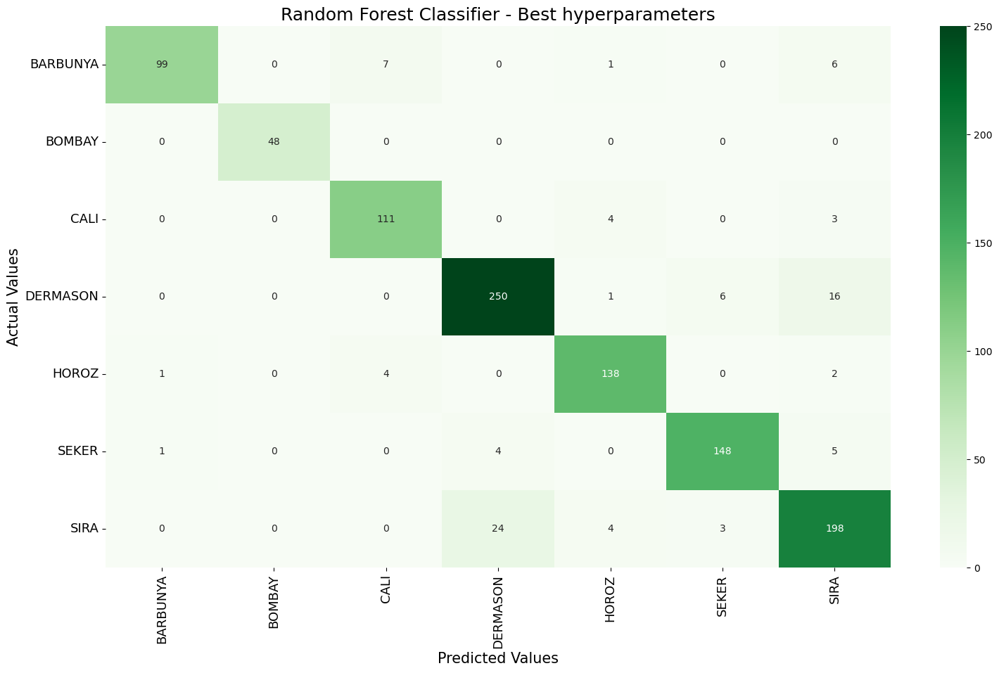

In [73]:
plot_confusion_matrix(bean_label_val, rfc_pred,"Random Forest Classifier - Best hyperparameters")

### ⦿ Final Random Forest Classifier model

⦿ As The results have only slightly improved with n_estimators=400. The final model would have only this hyperparameter modified.  
⦿ The test data would be used to test the model

In [88]:
#Creating a Random Forest Classifier model instance
rfc = RandomForestClassifier(n_estimators=400)

#Fitting the model on the train data
rfc.fit(bean_feat_train, bean_label_train)

RandomForestClassifier(n_estimators=400)

In [89]:
#Evaluating model with validation data
rfc_pred = rfc.predict(bean_feat_test)
print(classification_report(bean_label_test, rfc_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.92      0.88      0.90       244
      BOMBAY       1.00      1.00      1.00        92
        CALI       0.93      0.94      0.93       324
    DERMASON       0.91      0.93      0.92       713
       HOROZ       0.94      0.94      0.94       356
       SEKER       0.96      0.94      0.95       446
        SIRA       0.88      0.89      0.89       534

    accuracy                           0.92      2709
   macro avg       0.94      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



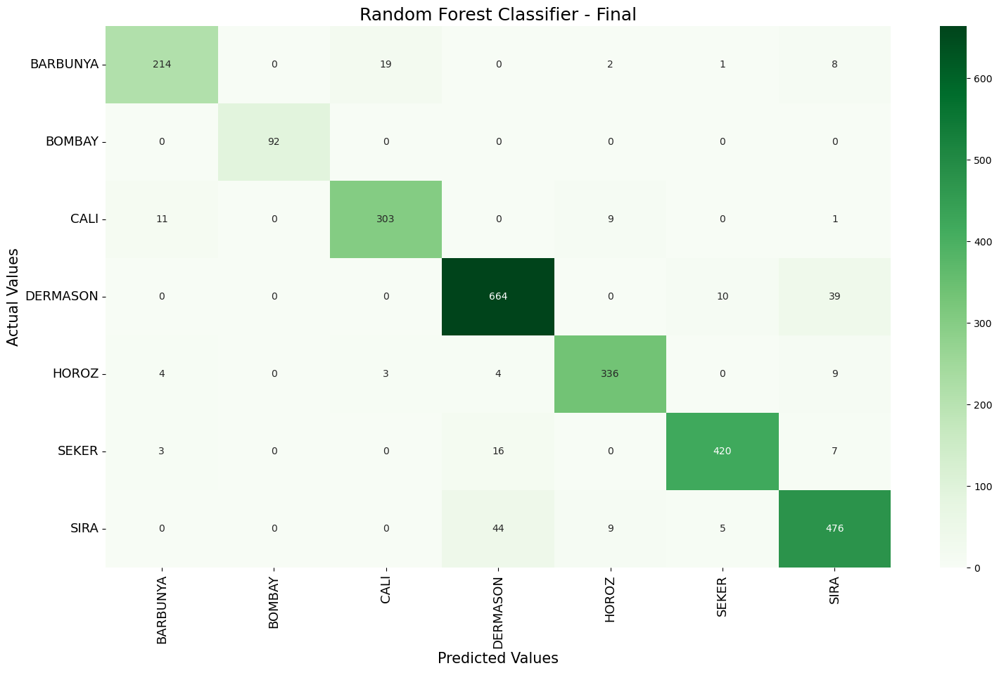

In [91]:
plot_confusion_matrix(bean_label_test, rfc_pred,"Random Forest Classifier - Final")

## Best Model Output

In [96]:
bean_feat_test

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
1380,41536,734.376,255.605812,207.072066,1.234381,0.586260,41861,229.967993,0.793111,0.992236,0.967827,0.899698,0.006154,0.002487,0.809456,0.999177
10194,24212,565.792,206.260683,149.780156,1.377090,0.687516,24489,175.578119,0.728137,0.988689,0.950445,0.851244,0.008519,0.002759,0.724616,0.997861
12974,36956,717.549,272.453338,173.157959,1.573438,0.772059,37464,216.918972,0.736234,0.986440,0.901969,0.796169,0.007372,0.001827,0.633885,0.997380
12992,37064,710.701,265.110185,178.209228,1.487634,0.740362,37390,217.235703,0.706142,0.991281,0.922122,0.819417,0.007153,0.001989,0.671444,0.998863
6476,53945,915.187,378.881900,181.827336,2.083746,0.877320,54488,262.078056,0.615150,0.990035,0.809359,0.691714,0.007023,0.000992,0.478469,0.997007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11385,30243,647.283,230.574684,167.359363,1.377722,0.687868,30655,196.230944,0.749183,0.986560,0.907082,0.851052,0.007624,0.002467,0.724289,0.997869
4768,75846,1055.133,416.847154,233.111273,1.788190,0.829016,76592,310.757343,0.759424,0.990260,0.856107,0.745495,0.005496,0.001047,0.555762,0.993808
10636,27215,610.564,226.730138,153.075884,1.481162,0.737684,27493,186.148366,0.715713,0.989888,0.917394,0.821013,0.008331,0.002335,0.674062,0.998395
11608,31033,649.385,236.304711,167.764990,1.408546,0.704250,31416,198.777370,0.751477,0.987809,0.924760,0.841191,0.007615,0.002352,0.707602,0.996690


In [97]:
#Creating a DataFrame with index and predicted labels
output = {'Index': bean_feat_test.index, 'Predicted Labels': rfc_pred}
output_df = pd.DataFrame(output)

#Checking output
output_df

,Index,Predicted Labels
0,1380,SEKER
1,10194,DERMASON
2,12974,DERMASON
3,12992,DERMASON
4,6476,HOROZ
...,...,...
2704,11385,DERMASON
2705,4768,CALI
2706,10636,DERMASON
2707,11608,DERMASON


In [98]:
#Saving to output file
output_df.to_csv("output.csv", index=False)